1.1 
We begin with a a padding functions to facilitate our convolution.

In [1]:
import numpy as np

def pad_zero(img: np.ndarray, pad_y: int, pad_x: int):
    """Zero-pad a grayscale image by pad_y rows and pad_x cols on each side."""
    H, W = img.shape
    out = np.zeros((H + 2*pad_y, W + 2*pad_x), dtype=img.dtype)
    out[pad_y:pad_y+H, pad_x:pad_x+W] = img
    return out

We can now construct our two convolution custom functions, with four loops and two loops.

In [2]:
def conv_four_loops(img: np.ndarray, kernel: np.ndarray):
    kh, kw = kernel.shape
    src = pad_zero(img, kh, kw)
    outH, outW = img.shape
    out = np.zeros((outH, outW), dtype=np.float64)
    for y in range(outH):
        for x in range(outW):
            inner_prod = 0.0
            for j in range(kh):
                for i in range(kw):
                    y0 = y + j
                    x0 = x + i
                    inner_prod += src[y0, x0] * kernel[kh-1-j, kw-1-i]  # convolution requires a flipped kernel
            out[y, x] = inner_prod
    return out

In [3]:
def conv_two_loops(img: np.ndarray, kernel: np.ndarray):
    kh, kw = kernel.shape

    src = pad_zero(img, kh, kw)
    outH, outW = img.shape
    out = np.zeros((outH, outW), dtype=np.float64)
    kflip = kernel[::-1, ::-1]
    for y in range(outH):
        for x in range(outW):
            window = src[y:y+kh, x:x+kw]
            out[y, x] = np.sum(window * kflip)
    return out

In [23]:
# The filters we need to apply to our image
box9 = np.ones((9, 9), dtype=np.float64) / 81.0

Dx = np.array([[-1, 0, 1]], dtype=np.float64)     
Dy = Dx.T  

import imageio.v3 as iio
import matplotlib.pyplot as plt

#We add this gray filter for color images, and for our gray images to collapse the image into 2d
def rgb2gray(img):
    if img.ndim == 3 and img.shape[2] == 3:
        arr = img.astype(np.float64)
        if arr.max() > 1.0:
            arr /= 255.0
        r, g, b = arr[...,0], arr[...,1], arr[...,2]
        return 0.299*r + 0.587*g + 0.114*b
    elif img.ndim == 2:
        arr = img.astype(np.float64)
        if arr.max() > 1.0:
            arr /= 255.0
        return arr

img_path = "image.jpg"
img_raw = iio.imread(img_path)
img = rgb2gray(img_raw)


In [5]:
blur = conv_two_loops(img, box9)

gx = conv_two_loops(img, Dx)   # horizontal edges
gx = np.abs(gx)
gx = gx/(gx.max())
gy = conv_two_loops(img, Dy)   # vertical edges
gy = np.abs(gy)
gy = gy/(gy.max())

mag = np.hypot(gx, gy)
mag /= (mag.max() + 1e-12)

In [22]:
def show_gray(a, title, savepath = None):
    plt.figure()
    plt.imshow(a, cmap='gray')
    plt.title(title)
    plt.axis('off')
    if savepath:
        plt.savefig(savepath, dpi=200, bbox_inches='tight')
    plt.show()

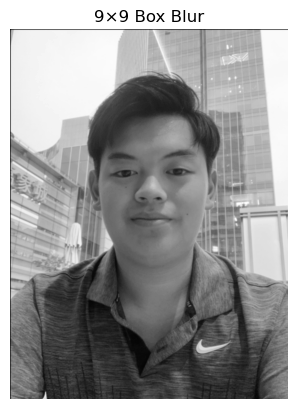

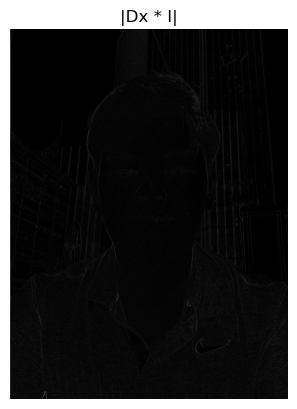

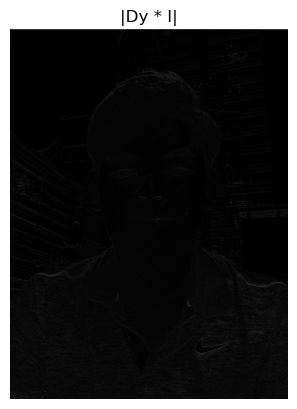

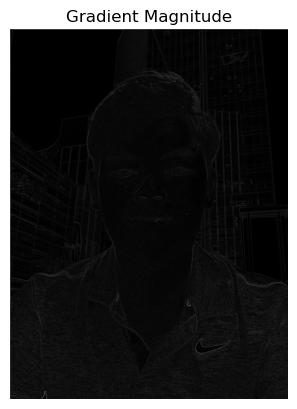

In [7]:
show_gray(blur, "9×9 Box Blur", "1.1_blur.png")
show_gray(np.abs(gx), "|Dx * I|")
show_gray(np.abs(gy), "|Dy * I|")
show_gray(mag, "Gradient Magnitude", "1.1_mag.png")

Let's also try with convolve2D

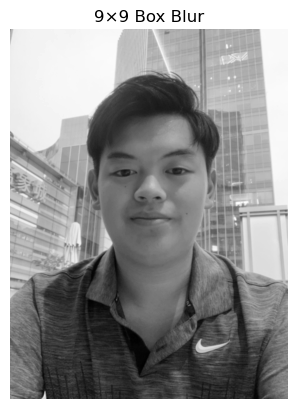

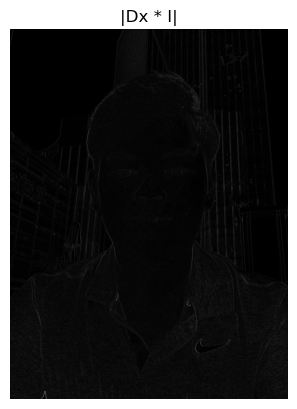

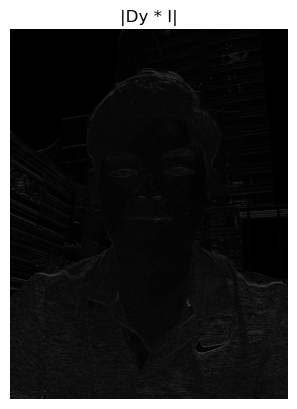

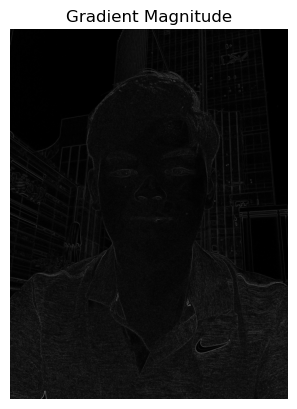

In [6]:
from scipy.signal import convolve2d

blur = convolve2d(img, box9, mode='same', boundary='symm')
gx = convolve2d(img, Dx, mode='same', boundary='symm')
gy = convolve2d(img, Dy, mode='same', boundary='symm')
mag = np.hypot(gx, gy)
mag /= (mag.max() + 1e-12)

show_gray(blur, "9×9 Box Blur")
show_gray(np.abs(gx), "|Dx * I|")
show_gray(np.abs(gy), "|Dy * I|")
show_gray(mag, "Gradient Magnitude")

We now do this with the cameraman image.

In [9]:
camera_path = "cameraman.png"
camera_raw = iio.imread(camera_path)
rgb_camera = camera_raw[..., :3]
camera = rgb2gray(rgb_camera)

In [10]:
from scipy.signal import convolve2d

gx = convolve2d(camera, Dx, mode='same', boundary='symm')
gy = convolve2d(camera, Dy, mode='same', boundary='symm')
mag = np.hypot(gx, gy)
mag /= (mag.max() + 1e-12)


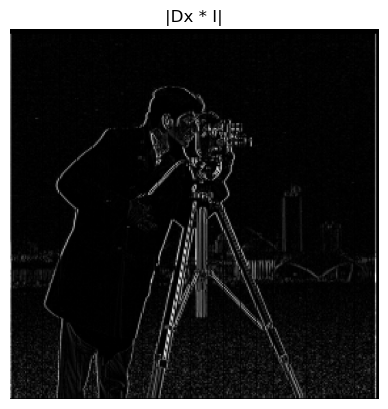

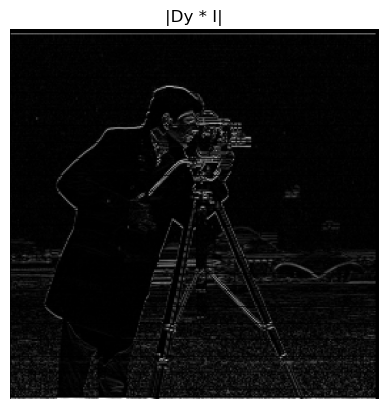

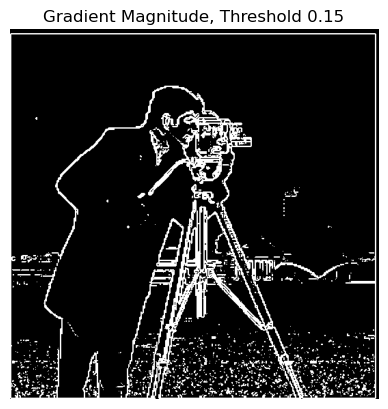

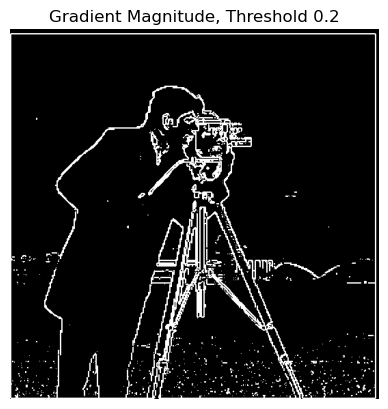

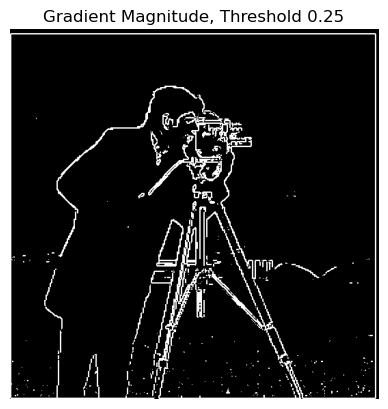

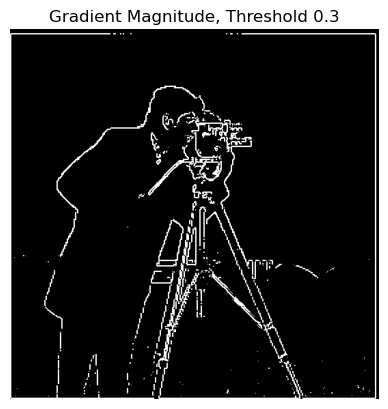

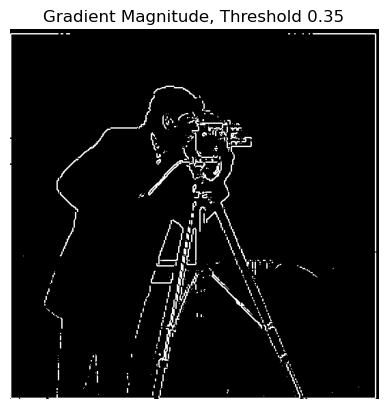

In [11]:
show_gray(np.abs(gx), "|Dx * I|", "1.2_gx.png")
show_gray(np.abs(gy), "|Dy * I|", "1.2_gy.png")
for threshold in [.15, .2, .25, .3, .35]:
    edges = (mag >= threshold)
    savepath = "1.2_"+str(threshold)+"_threshold.png"
    title = "Gradient Magnitude, Threshold " + str(threshold)
    show_gray(edges, title, savepath)

In [ ]:
kernel_size = 7
sigma = 1.5

ax = np.arange(kernel_size) - (kernel_size - 1) / 2.0
kernel = np.exp(-(ax**2) / (2 * sigma**2))

gaussian = np.outer(kernel, kernel).astype(np.float64)
gaussian /= gaussian.sum()

#make DoG filters
DoGx = convolve2d(gaussian, Dx, mode='full')
DoGy = convolve2d(gaussian, Dy, mode='full')

def visualize_kernel(kernel, title, savepath = None):
    kernel_mean = kernel - kernel.mean()
    kernel_mean /= (np.max(np.abs(kernel_mean)) + 1e-12)
    show_gray(kernel_mean, title, savepath)

visualize_kernel(DoGx, "DoGx", "1.3_DoGx.png")
visualize_kernel(DoGy, "DoGy", "1.3_DoGy.png")

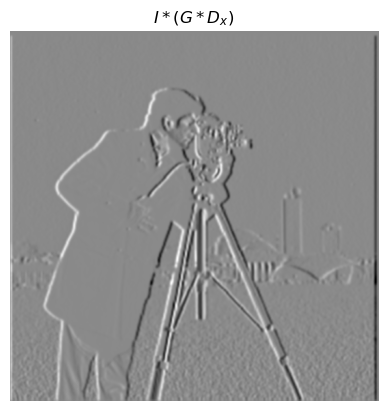

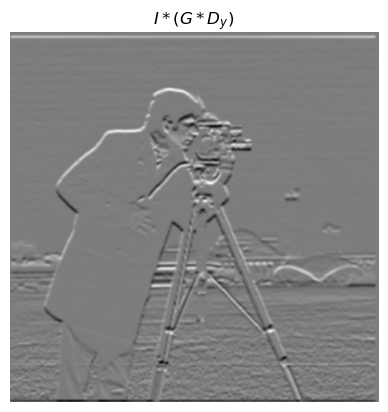

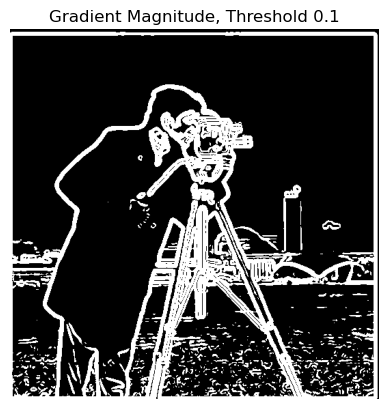

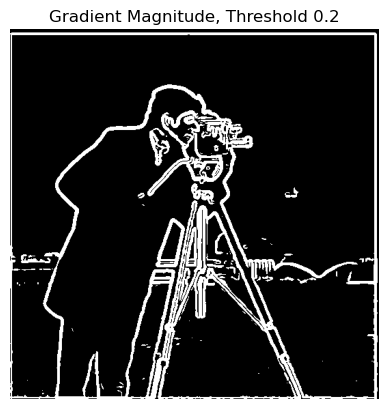

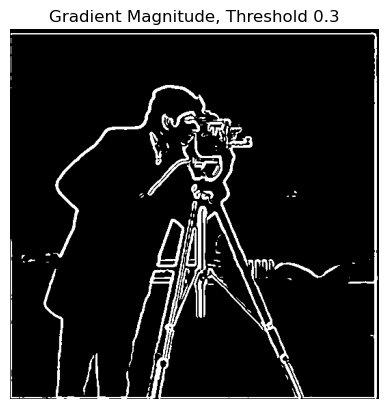

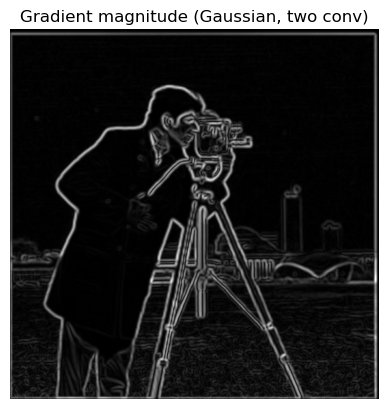

In [13]:


gaussian_blur = convolve2d(camera, gaussian, mode='same', boundary='symm')
gx_gaus = convolve2d(gaussian_blur, Dx, mode='same', boundary='symm')
gy_gaus = convolve2d(gaussian_blur, Dy, mode='same', boundary='symm')
mag_gaus = np.hypot(gx_gaus, gy_gaus)
mag_gaus /= (mag_gaus.max() + 1e-12)

show_gray(gx_gaus, r"$I * (G*D_x)$")
show_gray(gy_gaus, r"$I * (G*D_y)$")
for threshold in [.1, .2, .3]:
    edges_gaus = (mag_gaus >= threshold)
    savepath = "1.3_"+str(threshold)+"_threshold_gaus.png"
    title = "Gradient Magnitude, Threshold " + str(threshold)
    show_gray(edges_gaus, title, savepath)
show_gray(mag_gaus, "Gradient magnitude (Gaussian, two conv)")

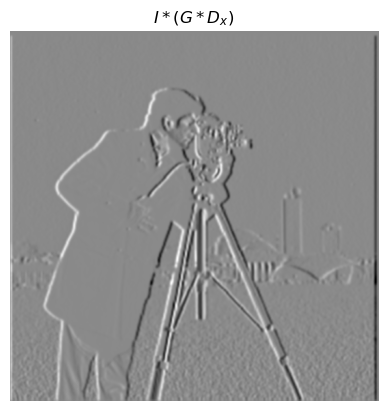

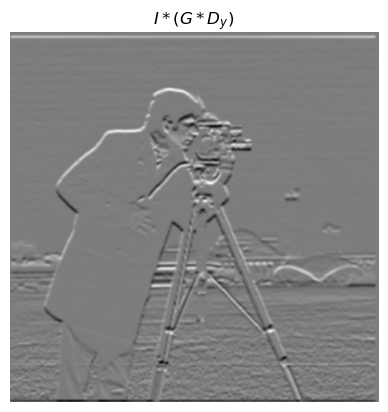

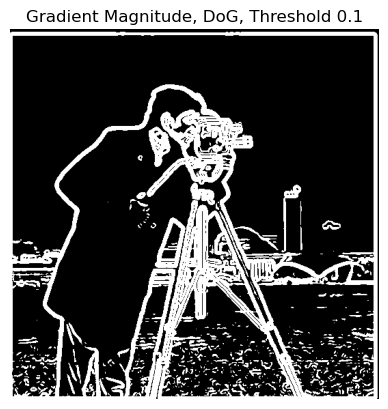

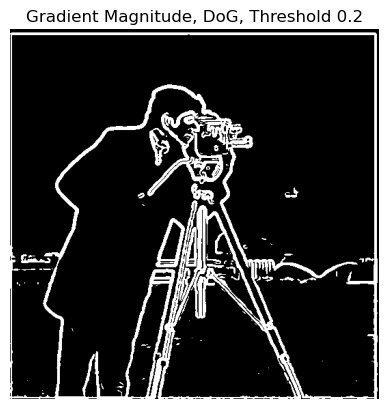

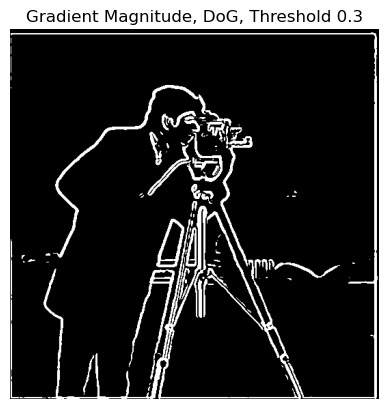

In [14]:
#using DoG filters

gx_dog = convolve2d(camera, DoGx, mode='same', boundary='symm')
gy_dog = convolve2d(camera, DoGy, mode='same', boundary='symm')
mag_dog = np.hypot(gx_dog, gy_dog)
mag_dog /= (mag_dog.max() + 1e-12)

show_gray(gx_dog, r"$I * (G*D_x)$", "1.3_DoGx.png")
show_gray(gy_dog, r"$I * (G*D_y)$", "1.3_DoGy.png")
for threshold in [.1, .2, .3]:
    edges_dog = (mag_dog >= threshold)
    savepath = "1.3_"+str(threshold)+"_threshold_DoG.png"
    title = "Gradient Magnitude, DoG, Threshold " + str(threshold)
    show_gray(edges_dog, title, savepath)


In [15]:
mae_gx = np.mean(np.abs(gx_gaus - gx_dog))
mae_gy = np.mean(np.abs(gy_gaus - gy_dog))
mae_mag = np.mean(np.abs(mag_gaus - mag_dog))

print(f"MAE(gx):  {mae_gx:.3e}")
print(f"MAE(gy):  {mae_gy:.3e}")
print(f"MAE(|g|): {mae_mag:.3e}")

MAE(gx):  1.069e-16
MAE(gy):  1.135e-16
MAE(|g|): 2.563e-16


Unsharpening here.

In [16]:
def unsharp_kernel(ksize=7, sigma=1.5):
    ax = np.arange(kernel_size) - (kernel_size - 1) / 2.0
    kernel = np.exp(-(ax**2) / (2 * sigma**2))

    gaussian = np.outer(kernel, kernel).astype(np.float64)
    gaussian /= gaussian.sum()
    K = 2 + (-1 * gaussian)
    return K

def unsharp_single_conv(img, ksize=7, sigma=1.5):
    K = unsharp_kernel(ksize, sigma)
    sharp = convolve2d(img, K, mode='same', boundary='symm')
    sharp /= sharp.max()
    return sharp, K

def unsharp_two_steps(img, ksize=7, sigma=1.5):
    ax = np.arange(kernel_size) - (kernel_size - 1) / 2.0
    kernel = np.exp(-(ax**2) / (2 * sigma**2))

    gaussian = np.outer(kernel, kernel).astype(np.float64)
    gaussian /= gaussian.sum()
    
    blur = convolve2d(img, gaussian, mode='same', boundary='symm')
    high = img - blur
    sharp = img + high
    return np.clip(sharp, 0.0, 1.0), blur, high

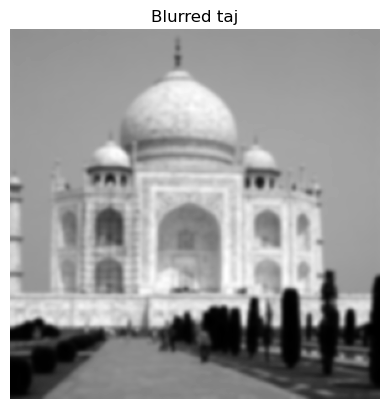

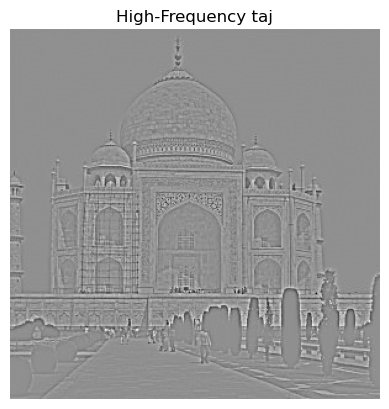

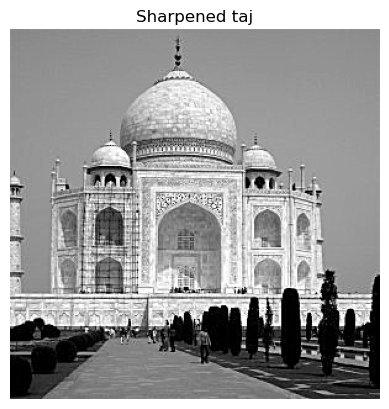

In [17]:
taj_path = "taj.jpg"
taj_raw = iio.imread(taj_path)
taj = rgb2gray(taj_raw)

sharp, blur, high = unsharp_two_steps(taj)
show_gray(blur, "Blurred taj", "2.1_blur.png")
show_gray(high, "High-Frequency taj", "2.1_high.png")
show_gray(sharp, "Sharpened taj", "2.1_sharp.png")

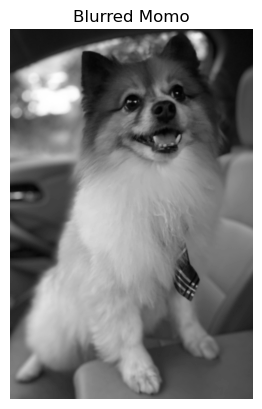

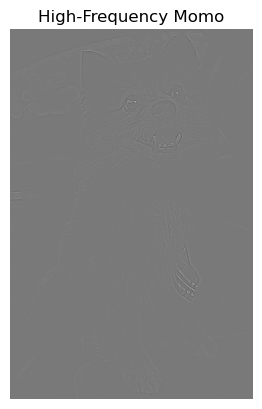

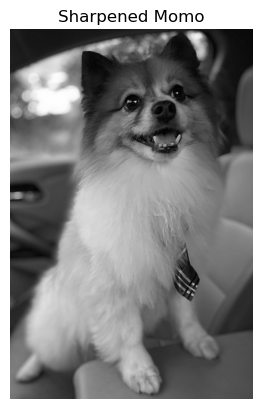

In [18]:
momo_path = "momo.png"
momo_raw = iio.imread(momo_path)
rgb_momo = momo_raw[..., :3]
momo = rgb2gray(rgb_momo)


sharp, blur, high = unsharp_two_steps(momo)
show_gray(blur, "Blurred Momo", "2.1_blur_dog.png")
show_gray(high, "High-Frequency Momo", "2.1_high_dog.png")
show_gray(sharp, "Sharpened Momo", "2.1_sharp_dog.png")

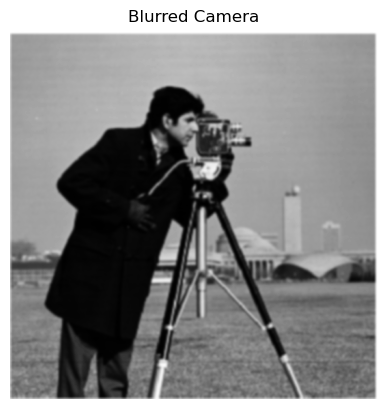

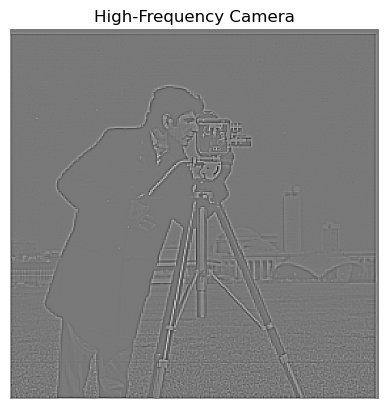

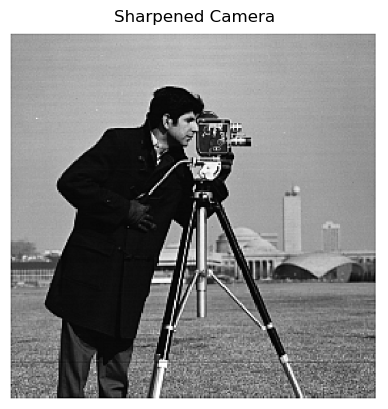

In [19]:
sharp, blur, high = unsharp_two_steps(camera)
show_gray(blur, "Blurred Camera", "2.1_blur_cam.png")
show_gray(high, "High-Frequency Camera", "2.1_high_cam.png")
show_gray(sharp, "Sharpened Camera", "2.1_sharp_cam.png")

In [1]:
import math
import numpy as np
import matplotlib.pyplot as plt
import skimage.transform as sktr
from scipy.signal import convolve2d


def get_points(im1, im2):
    print('Please select 2 points in each image for alignment.')
    plt.imshow(im1)
    p1, p2 = plt.ginput(2)
    plt.close()
    plt.imshow(im2)
    p3, p4 = plt.ginput(2)
    plt.close()
    return (p1, p2, p3, p4)

def recenter(im, r, c):
    R, C, _ = im.shape
    rpad = (int) (np.abs(2*r+1 - R))
    cpad = (int) (np.abs(2*c+1 - C))
    return np.pad(
        im, [(0 if r > (R-1)/2 else rpad, 0 if r < (R-1)/2 else rpad),
             (0 if c > (C-1)/2 else cpad, 0 if c < (C-1)/2 else cpad),
             (0, 0)], 'constant')

def find_centers(p1, p2):
    cx = np.round(np.mean([p1[0], p2[0]]))
    cy = np.round(np.mean([p1[1], p2[1]]))
    return cx, cy

def align_image_centers(im1, im2, pts):
    p1, p2, p3, p4 = pts
    h1, w1, b1 = im1.shape
    h2, w2, b2 = im2.shape
    
    cx1, cy1 = find_centers(p1, p2)
    cx2, cy2 = find_centers(p3, p4)

    im1 = recenter(im1, cy1, cx1)
    im2 = recenter(im2, cy2, cx2)
    return im1, im2

def rescale_images(im1, im2, pts):
    p1, p2, p3, p4 = pts
    len1 = np.sqrt((p2[1] - p1[1])**2 + (p2[0] - p1[0])**2)
    len2 = np.sqrt((p4[1] - p3[1])**2 + (p4[0] - p3[0])**2)
    dscale = len2/len1
    if dscale < 1:
        im1 = sktr.rescale(im1, dscale, channel_axis=-1)
    else:
        im2 = sktr.rescale(im2, 1./dscale, channel_axis=-1)
    return im1, im2

def rotate_im1(im1, im2, pts):
    p1, p2, p3, p4 = pts
    theta1 = math.atan2(-(p2[1] - p1[1]), (p2[0] - p1[0]))
    theta2 = math.atan2(-(p4[1] - p3[1]), (p4[0] - p3[0]))
    dtheta = theta2 - theta1
    im1 = sktr.rotate(im1, dtheta*180/np.pi)
    return im1, dtheta

def match_img_size(im1, im2):
    # Make images the same size
    h1, w1, c1 = im1.shape
    h2, w2, c2 = im2.shape
    if h1 < h2:
        im2 = im2[int(np.floor((h2-h1)/2.)) : -int(np.ceil((h2-h1)/2.)), :, :]
    elif h1 > h2:
        im1 = im1[int(np.floor((h1-h2)/2.)) : -int(np.ceil((h1-h2)/2.)), :, :]
    if w1 < w2:
        im2 = im2[:, int(np.floor((w2-w1)/2.)) : -int(np.ceil((w2-w1)/2.)), :]
    elif w1 > w2:
        im1 = im1[:, int(np.floor((w1-w2)/2.)) : -int(np.ceil((w1-w2)/2.)), :]
    
    assert im1.shape == im2.shape
    return im1, im2

def align_images(im1, im2):
    pts = get_points(im1, im2)
    im1, im2 = align_image_centers(im1, im2, pts)
    im1, im2 = rescale_images(im1, im2, pts)
    im1, angle = rotate_im1(im1, im2, pts)
    im1, im2 = match_img_size(im1, im2)
    return im1, im2

In [41]:
def gaussian_kernel_2d(kernel_size = 7, sigma = 1.5):
    ax = np.arange(kernel_size) - (kernel_size - 1) / 2.0
    kernel = np.exp(-(ax**2) / (2 * sigma**2))

    gaussian = np.outer(kernel, kernel).astype(np.float64)
    gaussian /= gaussian.sum()
    return gaussian

def low_pass(img, sigma):
    gaussian = gaussian_kernel_2d(math.ceil(3*sigma)+1, sigma) 
    return convolve2d(img, gaussian, mode="same", boundary='symm')

def high_pass(img, sigma):
    lp = gaussian_blur(img, 3*sigma, sigma)
    return img - lp

def hybrid_image(im_high: np.ndarray,
                 im_low:  np.ndarray,
                 sigma_high: float,
                 sigma_low:  float,
                alpha  = 1):
    hp = high_pass(im_high, sigma_high)          
    lp = low_pass(im_low,  sigma_low)          
    H = lp + alpha * hp
    return np.clip(H, 0, 1), hp, lp

def hybrid_image_color(im_high: np.ndarray,
                 im_low:  np.ndarray,
                 sigma_high: float,
                 sigma_low:  float,
                alpha  = 1):
    hp = high_pass(im_high, sigma_high)          
    lp = gaussian_blur(im_low, 3*sigma_low, sigma_low)          
    H = lp + alpha * hp
    return np.clip(H, 0, 1), hp, lp

In [22]:

import matplotlib
matplotlib.use("Qt5Agg")
import matplotlib.pyplot as plt

# First load images

# high sf
im1 = plt.imread('./DerekPicture.jpg')/255.

# low sf
im2 = plt.imread('./nutmeg.jpg')/255
# Next align images (this code is provided, but may be improved)
im2_aligned, im1_aligned = align_images(im2, im1)
im1 = rgb2gray(im1_aligned)
im2 = rgb2gray(im2_aligned)

## You will provide the code below. Sigma1 and sigma2 are arbitrary 
## cutoff values for the high and low frequencies

sigma1 = 2.5
sigma2 = 8.0
hybrid, hp, lp = hybrid_image(im2, im1, sigma1, sigma2, 4)

print("Done Aligning/Hybridizing")
## Compute and display Gaussian and Laplacian Pyramids
## You also need to supply this function
N = 5 # suggested number of pyramid levels (your choice)
#pyramids(hybrid, N)

(1024, 732, 3)
(1056, 1408, 3)
Please select 2 points in each image for alignment.
Done Aligning/Hybridizing


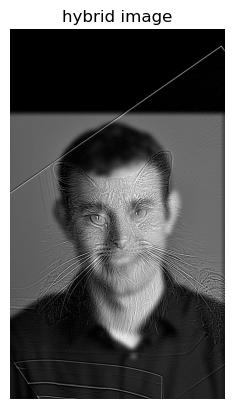

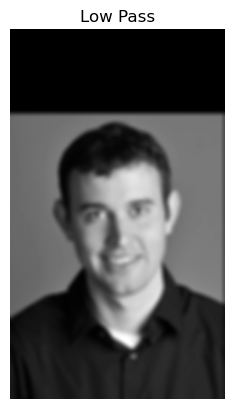

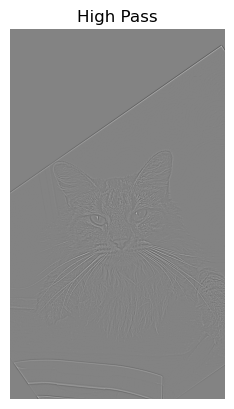

In [24]:
%matplotlib inline
show_gray(hybrid, "hybrid image", "2.2_dereknut.jpg")
show_gray(lp, "Low Pass", "2.2_dereklow.jpg")
show_gray(hp, "High Pass", "2.2_nutmeghigh.jpg")

In [57]:
matplotlib.use("Qt5Agg")

im1 = plt.imread('./color_image.jpeg')/255.
im2 = plt.imread('./color2.jpg')/255
# Next align images (this code is provided, but may be improved)
im2_aligned, im1_aligned = align_images(im2, im1)
im1 = rgb2gray(im1_aligned)
im2 = rgb2gray(im2_aligned)

## You will provide the code below. Sigma1 and sigma2 are arbitrary 
## cutoff values for the high and low frequencies

Please select 2 points in each image for alignment.


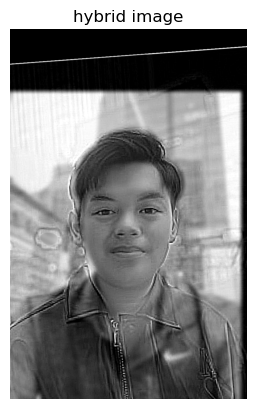

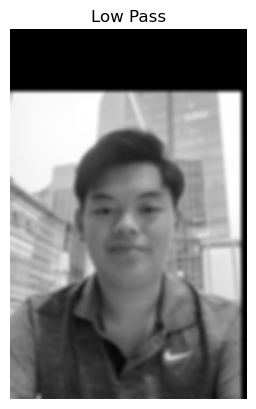

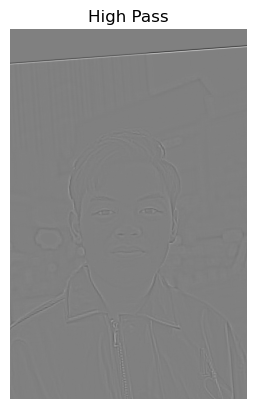

In [58]:
sigma1 = 3.0
sigma2 = 7.0
hybrid, hp, lp = hybrid_image(im2, im1, sigma1, sigma2, 7)

%matplotlib inline
show_gray(hybrid, "hybrid image", "2.2_me_hybrid.jpg")
show_gray(lp, "Low Pass", "2.2_me_low.jpg")
show_gray(hp, "High Pass", "2,2)me_high.jpg")

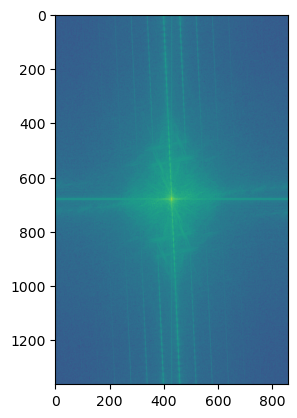

In [95]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(hybrid)))))
plt.savefig("2.2_fourier.png", dpi=300, bbox_inches="tight")

In [71]:
matplotlib.use("Qt5Agg")

im1 = plt.imread('./momo2.jpeg')/255.
im2 = plt.imread('./momo.jpg')/255
# Next align images (this code is provided, but may be improved)
im2_aligned, im1_aligned = align_images(im2, im1)
im1 = rgb2gray(im1_aligned)
im2 = rgb2gray(im2_aligned)

## You will provide the code below. Sigma1 and sigma2 are arbitrary 
## cutoff values for the high and low frequencies

Please select 2 points in each image for alignment.


In [33]:
im1 = rgb2gray(im1_aligned)
im2 = rgb2gray(im2_aligned)

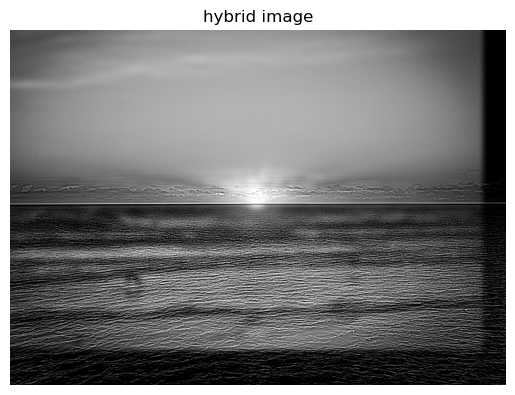

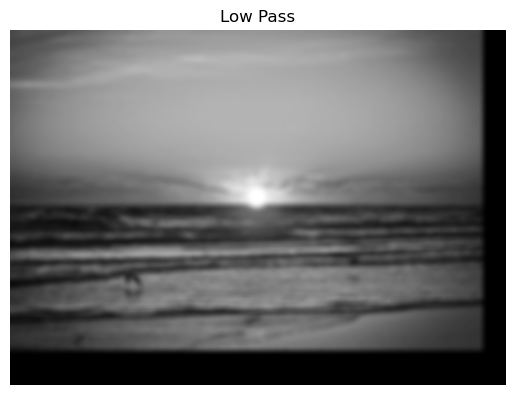

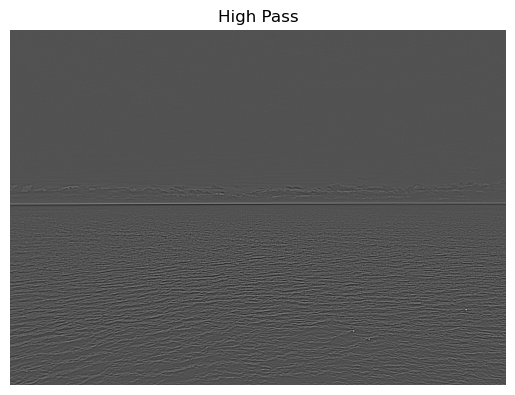

In [54]:
sigma1 = 3.0
sigma2 = 8.0
hybrid, hp, lp = hybrid_image(im2, im1, sigma1, sigma2, 5)

%matplotlib inline
show_gray(hybrid, "hybrid image")
show_gray(lp, "Low Pass")
show_gray(hp, "High Pass")

In [ ]:
sigma1 = 4.0
sigma2 = 10.0
hybrid, hp, lp = hybrid_image_color(im2_aligned, im1_aligned, sigma1, sigma2, 7)

%matplotlib inline
show_gray(hybrid, "hybrid image")
show_gray(lp, "Low Pass")
show_gray(hp, "High Pass")

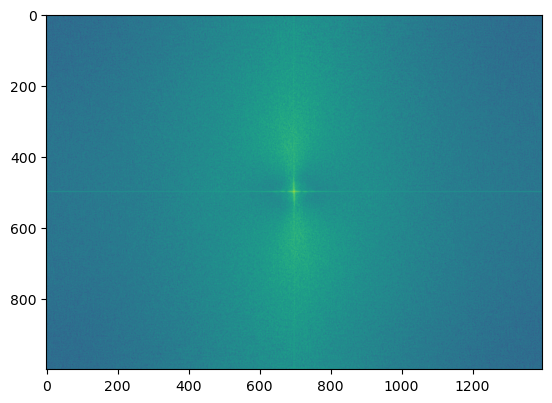

In [55]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(hybrid)))))
plt.savefig("2.2_fourier2.png", dpi=300, bbox_inches="tight")

In [25]:
#Stacks


def gaussian_kernel_2d(kernel_size = 7, sigma = 1.5):
    ax = np.arange(kernel_size) - (kernel_size - 1) / 2.0
    kernel = np.exp(-(ax**2) / (2 * sigma**2))

    gaussian = np.outer(kernel, kernel).astype(np.float64)
    gaussian /= gaussian.sum()
    return gaussian

def gaussian_blur(img, kernel, sigma):
    gaussian = gaussian_kernel_2d(kernel, sigma)
    
    if img.ndim == 2: 
        out = convolve2d(img, gaussian, mode='same', boundary='symm')
        return out.astype(np.float32)

    elif img.ndim == 3:
        channels = [
            convolve2d(img[..., c], gaussian, mode='same', boundary='symm')
            for c in range(img.shape[2])
        ]
        return np.stack(channels, axis=-1).astype(np.float32)

def gaussian_stack(img, levels=5, sigma=2.0):
    G = [img.copy()]
    for level in range(1, levels):
        G.append(gaussian_blur(G[level-1], 3*sigma, sigma))
    return G

def laplacian_stack(gauss_stack):
    L = []
    for i in range(len(gauss_stack)-1):
        L.append(gauss_stack[i] - gauss_stack[i+1])
    L.append(gauss_stack[-1]) 
    return L

def reconstruct_image(L):
    out = np.zeros_like(L[0], dtype=np.float32)
    for layer in L[:-1]:
        out += layer
    out += L[-1]
    return np.clip(out, 0.0, 1.0)

def multires_blend(imgA, imgB, mask, levels=5, sigma=2.0):
    if imgA.ndim == 3 and mask.ndim == 2:
        mask = mask[..., None] 

    GA = gaussian_stack(imgA, levels, sigma)
    GB = gaussian_stack(imgB, levels, sigma)
    GM = gaussian_stack(mask, levels, 50)

    LA = laplacian_stack(GA)
    LB = laplacian_stack(GB)

    LAM = [GM[i]*LA[i] for i in range(levels)]
    LBM = [(1.0 - GM[i])*LB[i] for i in range(levels)]
    LS = LAM + LBM
    blended = reconstruct_image(LS)
    return np.clip(blended, 0.0, 1.0), LAM, LBM, GM

In [146]:
apple  = plt.imread('./apple.jpeg')/255 
orange = plt.imread('./orange.jpeg')/255

levels = 6
sigma = 2.0
GA = gaussian_stack(apple,  levels, sigma)
GB = gaussian_stack(orange, levels, sigma)
LA = laplacian_stack(GA)
LB = laplacian_stack(GB)

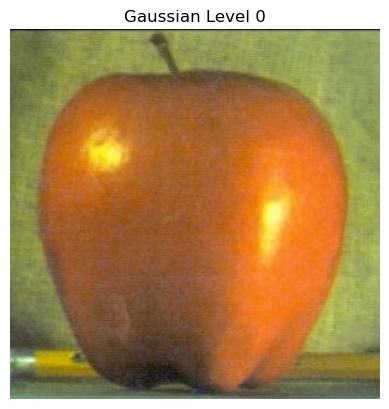

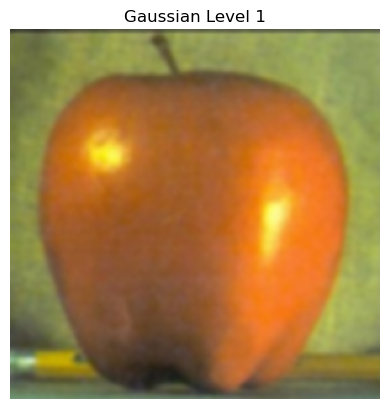

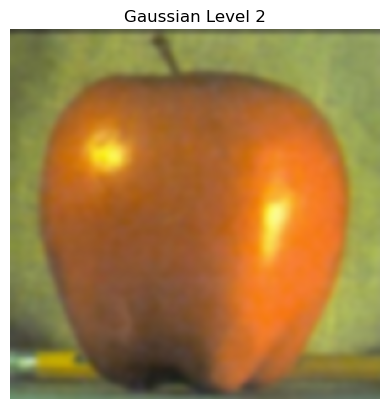

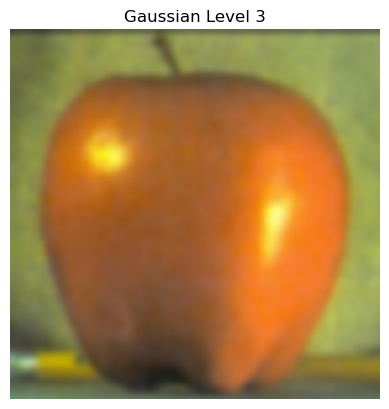

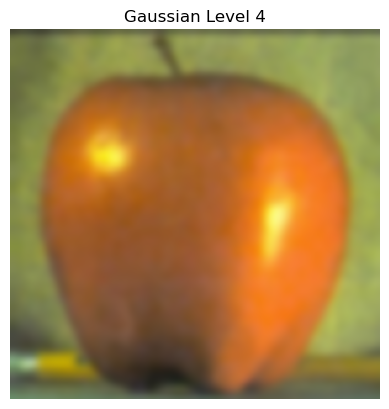

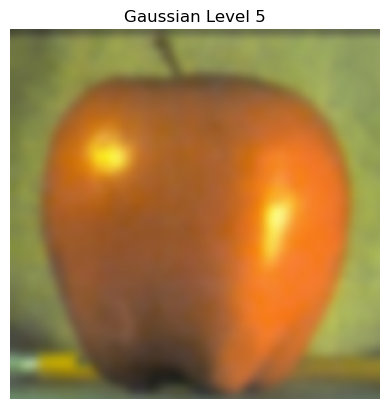

In [147]:
level = 0
for image in GA:
    title = "Gaussian Level " + str(level)
    path = "2.3_appleG_"+str(level)+".jpg"
    show_gray(image, title, path)
    level  = level + 1

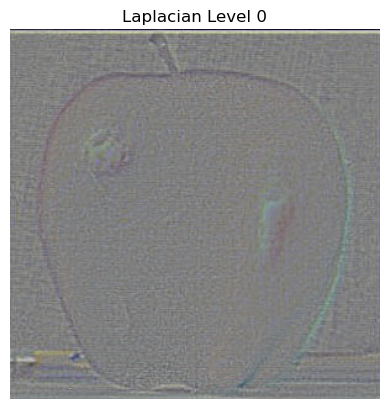

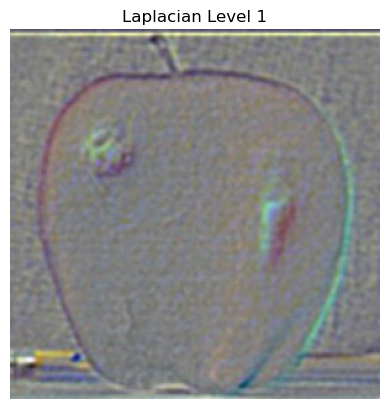

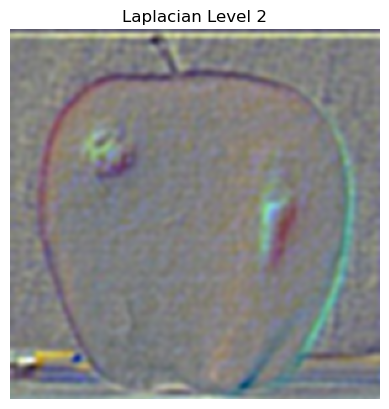

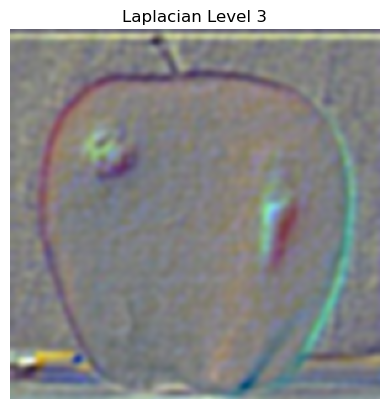

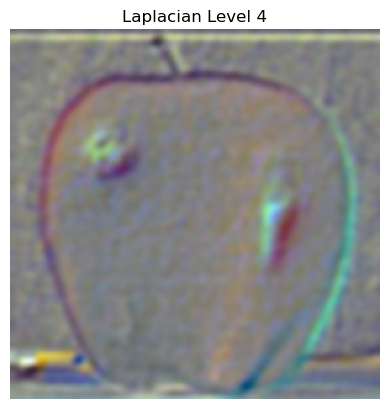

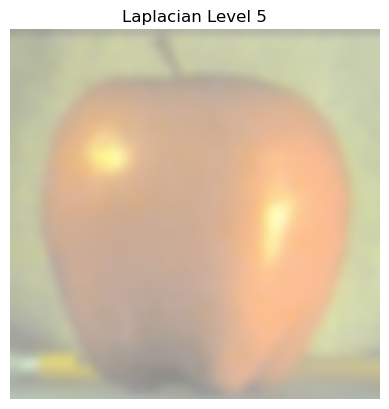

In [148]:
level = 0
for image in LA:
    title = "Laplacian Level " + str(level)
    path = "2.3_appleL_"+str(level)+".jpg"
    mx = np.max(np.abs(image)) + 1e-8             
    vis = 0.5 + image / (2 * mx)                  
    vis = np.clip(vis, 0, 1)
    show_gray(vis, title, path)
    level = level + 1

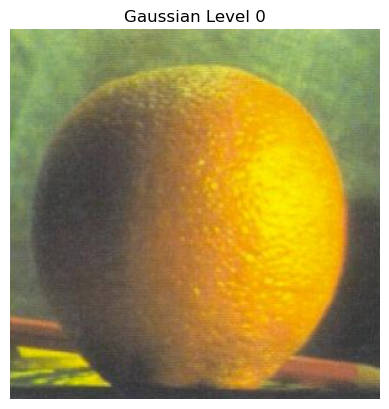

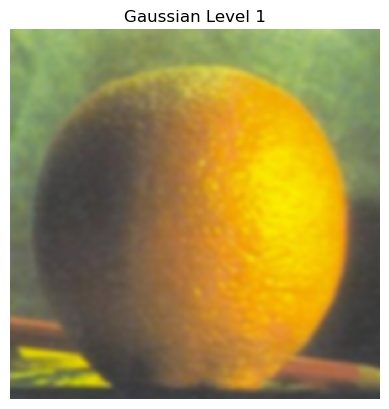

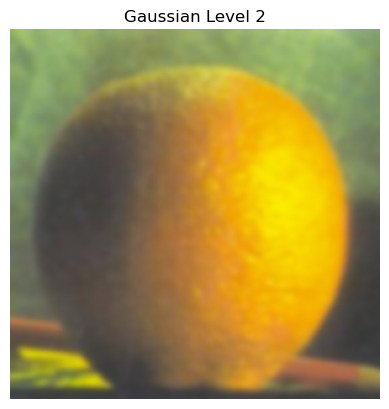

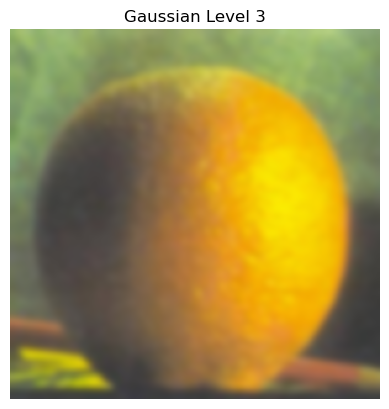

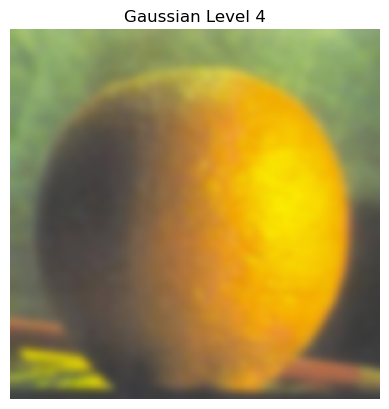

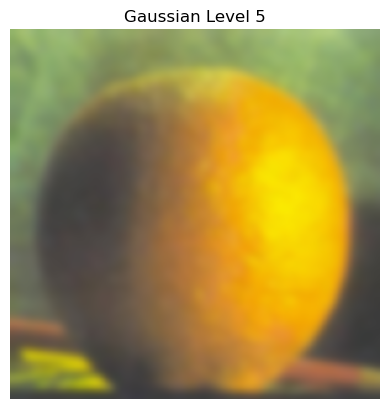

In [149]:
level = 0
for image in GB:
    title = "Gaussian Level " + str(level)
    path = "2.3_orangeG_"+str(level)+".jpg"
    show_gray(image, title, path)
    level  = level + 1

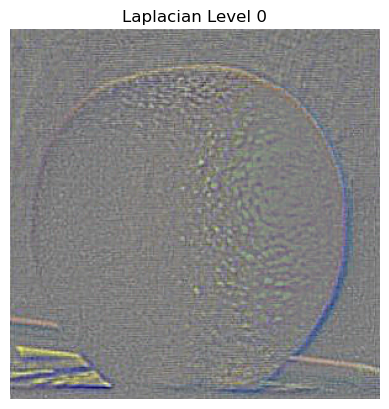

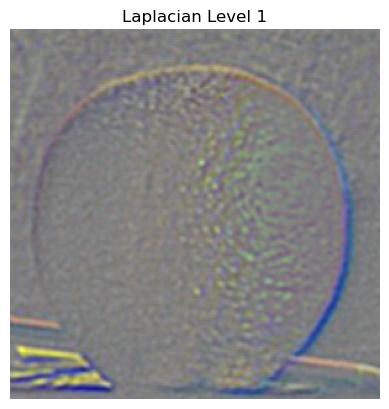

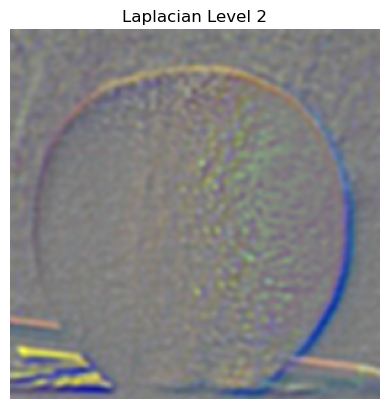

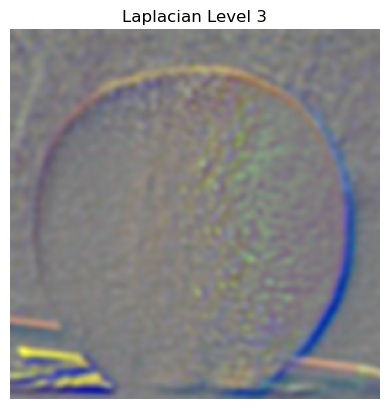

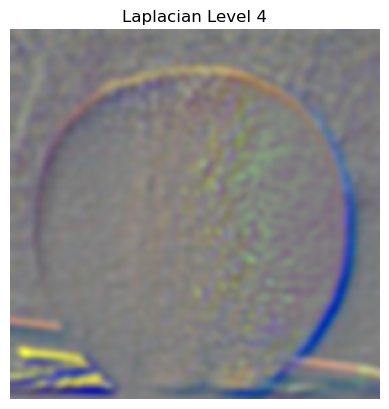

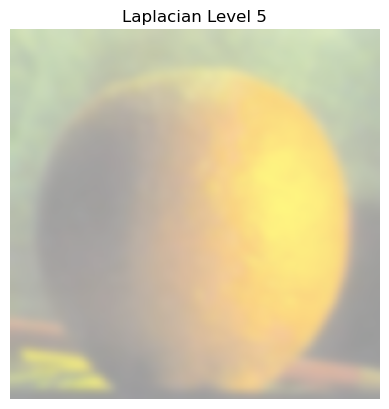

In [150]:
level = 0
for image in LB:
    title = "Laplacian Level " + str(level)
    path = "2.3_orangeL_"+str(level)+".jpg"
    mx = np.max(np.abs(image)) + 1e-8             
    vis = 0.5 + image / (2 * mx)                  
    vis = np.clip(vis, 0, 1)
    show_gray(vis, title, path)
    level = level + 1

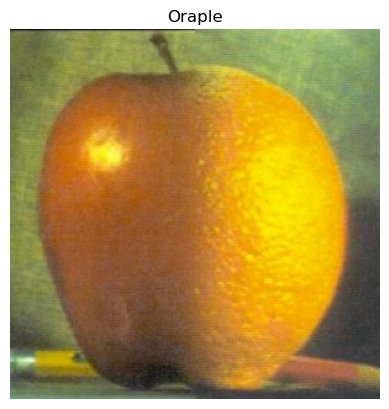

In [164]:
H, W = apple.shape[:2]
mask = np.zeros((H, W), dtype=np.float32)
mask[:, :W//2] = 1.0

levels, sigma = 6, 2.0
blended, LAM, LBM, GM = multires_blend(apple, orange, mask, levels, sigma)
show_gray(blended, "Oraple", "2.4_oraple.jpg")

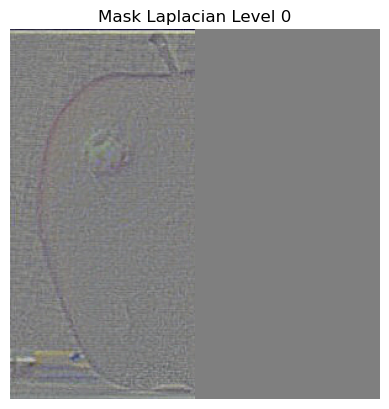

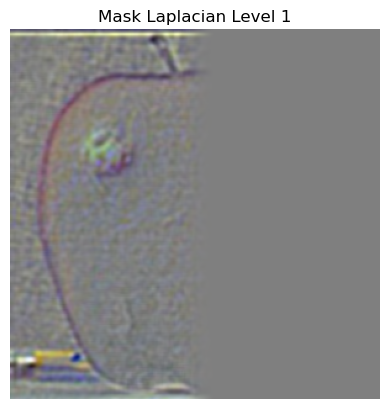

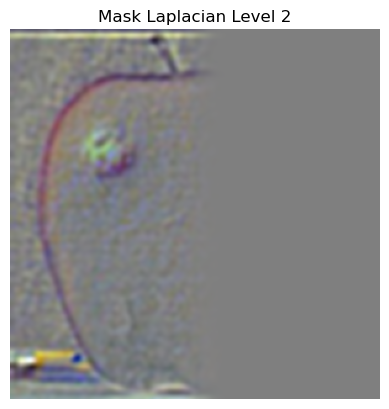

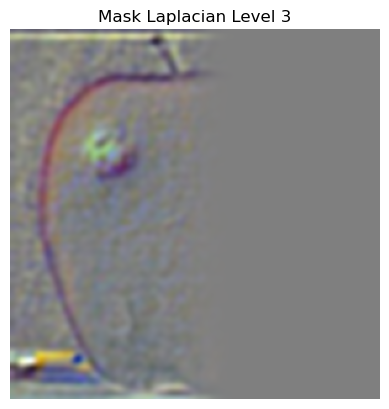

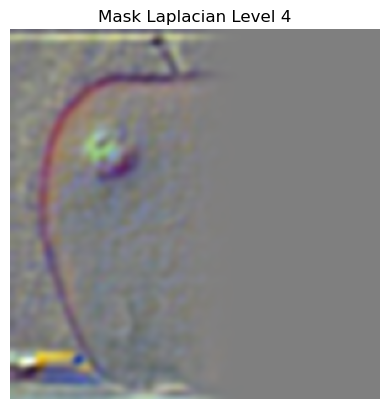

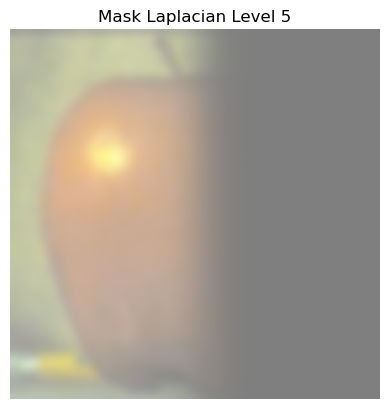

In [165]:
level = 0
for image in LAM:
    title = "Mask Laplacian Level " + str(level)
    path = "2.4_appleM_"+str(level)+".jpg"
    mx = np.max(np.abs(image)) + 1e-8             
    vis = 0.5 + image / (2 * mx)                  
    vis = np.clip(vis, 0, 1)
    show_gray(vis, title, path)
    level = level +1

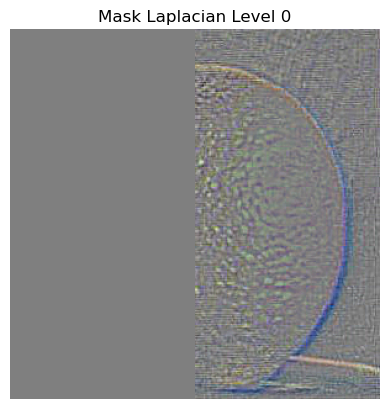

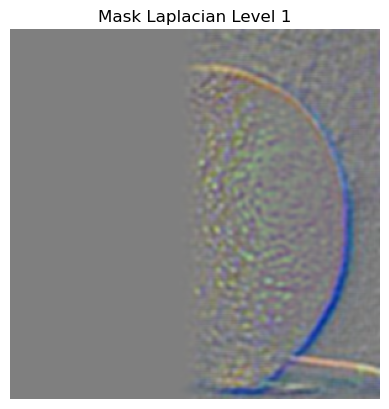

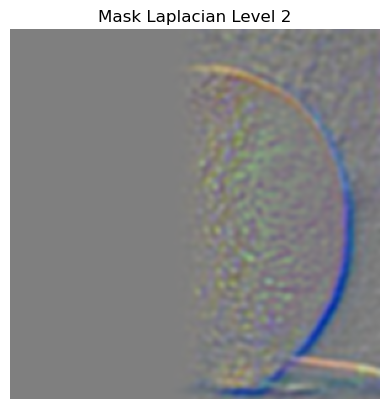

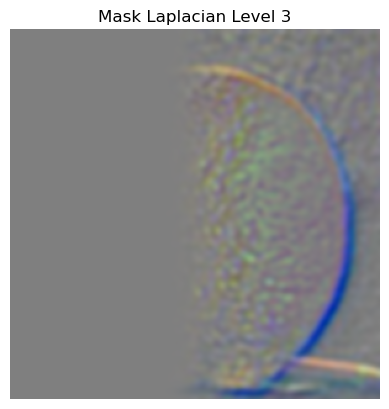

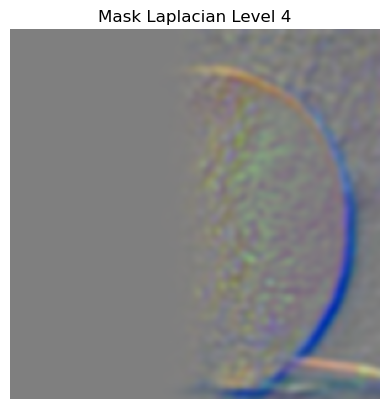

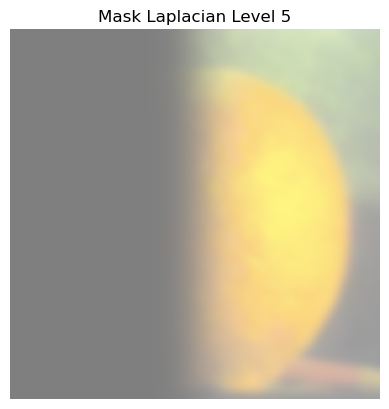

In [166]:
level = 0
for image in LBM:
    title = "Mask Laplacian Level " + str(level)
    path = "2.4_orangeM_"+str(level)+".jpg"
    mx = np.max(np.abs(image)) + 1e-8             
    vis = 0.5 + image / (2 * mx)                  
    vis = np.clip(vis, 0, 1)
    show_gray(vis, title, path)
    level = level +1

In [5]:
import matplotlib
matplotlib.use("Qt5Agg")

im1 = plt.imread('./rl_lilies.jpg')/255.
im2 = plt.imread('./monet_lilies.jpg')/255
# Next align images (this code is provided, but may be improved)
im2_aligned, im1_aligned = align_images(im2, im1)


Please select 2 points in each image for alignment.


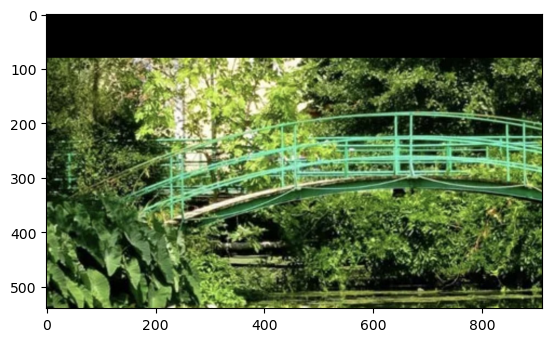

In [6]:
%matplotlib inline
plt.imshow(im1_aligned)

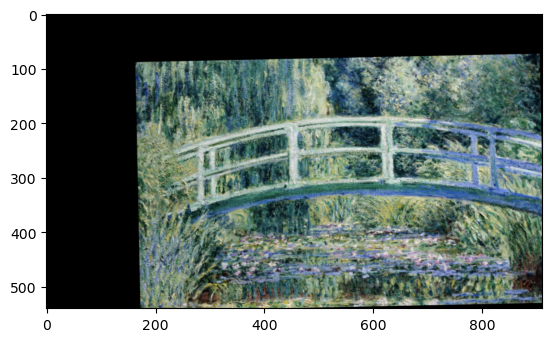

In [7]:
plt.imshow(im2_aligned)

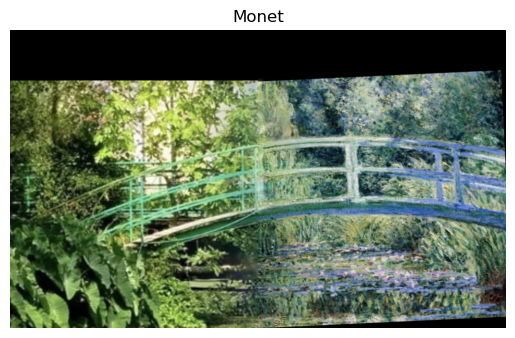

In [191]:
H, W = im2_aligned.shape[:2]
mask = np.zeros((H, W), dtype=np.float32)
mask[:, :W//2] = 1.0

levels, sigma = 6, 3.0
blended, LAM, LBM, GM = multires_blend(im1_aligned, im2_aligned, mask, levels, sigma)
show_gray(blended, "Monet", "2.4_monet.jpg")

In [28]:
import matplotlib
matplotlib.use("Qt5Agg")

im1 = plt.imread('./sunset.jpg')/255.
im2 = plt.imread('./clear_ocean.jpg')/255
# Next align images (this code is provided, but may be improved)
im2_aligned, im1_aligned = align_images(im2, im1)

Please select 2 points in each image for alignment.


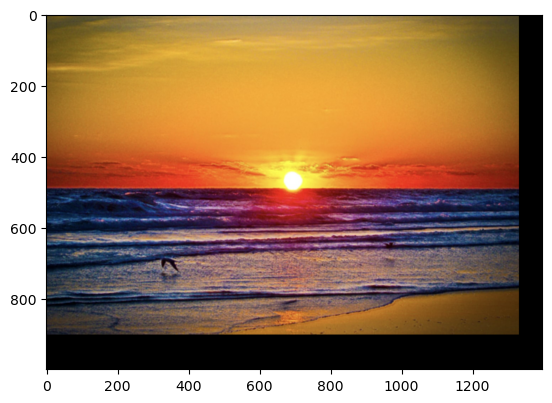

In [29]:
%matplotlib inline
plt.imshow(im1_aligned)

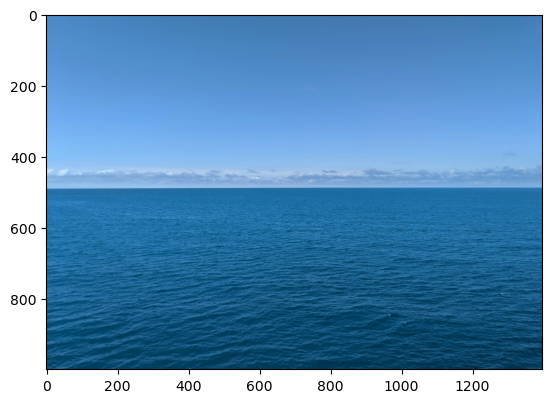

In [30]:
%matplotlib inline
plt.imshow(im2_aligned)

In [19]:
def circular_mask(img, radius=None, center=None):
    H, W = img.shape[:2]
    cx, cy = (W - 1) / 2.0, (H - 1) / 2.0
    radius = 0.4 * min(H, W)
    
    Y, X = np.mgrid[0:H, 0:W]
    dist = np.hypot(X - cx, Y - cy)
    
    mask = (dist <= radius).astype(np.float32)
    return mask

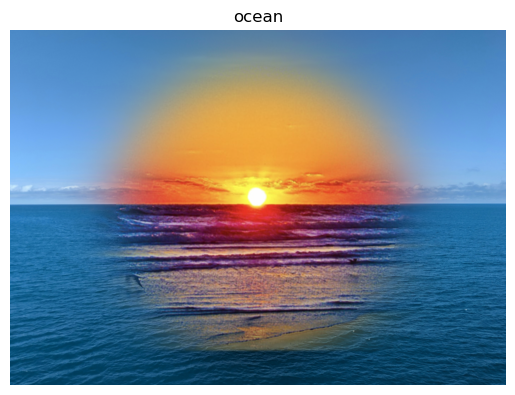

In [31]:
H, W = im2_aligned.shape[:2]
mask = circular_mask(im2_aligned)

levels, sigma = 6, 3.0
blended, LAM, LBM, GM = multires_blend(im1_aligned, im2_aligned, mask, levels, sigma)
show_gray(blended, "ocean", "2.4_ocean2.jpg")

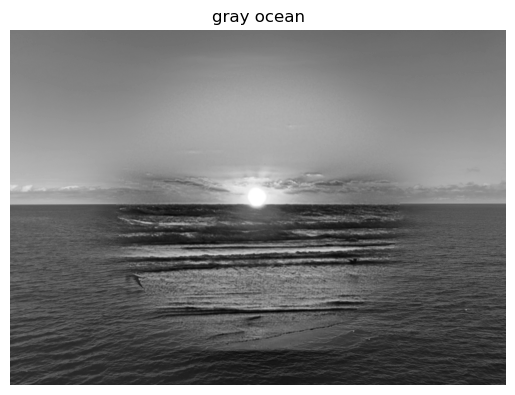

In [32]:
gray_blended = rgb2gray(blended)
show_gray(gray_blended, "gray ocean")